In [25]:
image_file=r'images\71gSRbyXmoL.jpg'

In [15]:
import matplotlib.pyplot as plt

In [16]:
import cv2
import numpy as np

In [26]:
img=cv2.imread(image_file)
cv2.imshow("original image",img)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [27]:
img=cv2.imread(image_file)

In [28]:
img

array([[[205, 186, 151],
        [206, 187, 152],
        [208, 189, 154],
        ...,
        [104, 211, 245],
        [102, 209, 243],
        [101, 208, 242]],

       [[206, 187, 152],
        [207, 188, 153],
        [208, 189, 154],
        ...,
        [105, 212, 246],
        [103, 210, 244],
        [102, 209, 243]],

       [[207, 188, 153],
        [208, 189, 154],
        [209, 190, 155],
        ...,
        [106, 213, 247],
        [105, 212, 246],
        [104, 211, 245]],

       ...,

       [[ 55,  59,  60],
        [ 55,  59,  60],
        [ 55,  59,  60],
        ...,
        [ 55,  59,  60],
        [ 54,  58,  59],
        [ 54,  58,  59]],

       [[ 55,  59,  60],
        [ 55,  59,  60],
        [ 55,  59,  60],
        ...,
        [ 56,  60,  61],
        [ 54,  58,  59],
        [ 54,  58,  59]],

       [[ 55,  59,  60],
        [ 55,  59,  60],
        [ 55,  59,  60],
        ...,
        [ 56,  60,  61],
        [ 54,  58,  59],
        [ 54,  58,  59]]

In [29]:
img

array([[[205, 186, 151],
        [206, 187, 152],
        [208, 189, 154],
        ...,
        [104, 211, 245],
        [102, 209, 243],
        [101, 208, 242]],

       [[206, 187, 152],
        [207, 188, 153],
        [208, 189, 154],
        ...,
        [105, 212, 246],
        [103, 210, 244],
        [102, 209, 243]],

       [[207, 188, 153],
        [208, 189, 154],
        [209, 190, 155],
        ...,
        [106, 213, 247],
        [105, 212, 246],
        [104, 211, 245]],

       ...,

       [[ 55,  59,  60],
        [ 55,  59,  60],
        [ 55,  59,  60],
        ...,
        [ 55,  59,  60],
        [ 54,  58,  59],
        [ 54,  58,  59]],

       [[ 55,  59,  60],
        [ 55,  59,  60],
        [ 55,  59,  60],
        ...,
        [ 56,  60,  61],
        [ 54,  58,  59],
        [ 54,  58,  59]],

       [[ 55,  59,  60],
        [ 55,  59,  60],
        [ 55,  59,  60],
        ...,
        [ 56,  60,  61],
        [ 54,  58,  59],
        [ 54,  58,  59]]

In [30]:
# TO display in jupyte
def display(im_path):
    dpi = 80
    im_data = plt.imread(im_path)

    height, width  = im_data.shape[:2]
    
    # What size does the figure need to be in inches to fit the image?
    figsize = width / float(dpi), height / float(dpi)

    # Create a figure of the right size with one axes that takes up the full figure
    fig = plt.figure(figsize=figsize)
    ax = fig.add_axes([0, 0, 1, 1])

    # Hide spines, ticks, etc.
    ax.axis('off')

    # Display the image.
    ax.imshow(im_data, cmap='gray')

    plt.show()

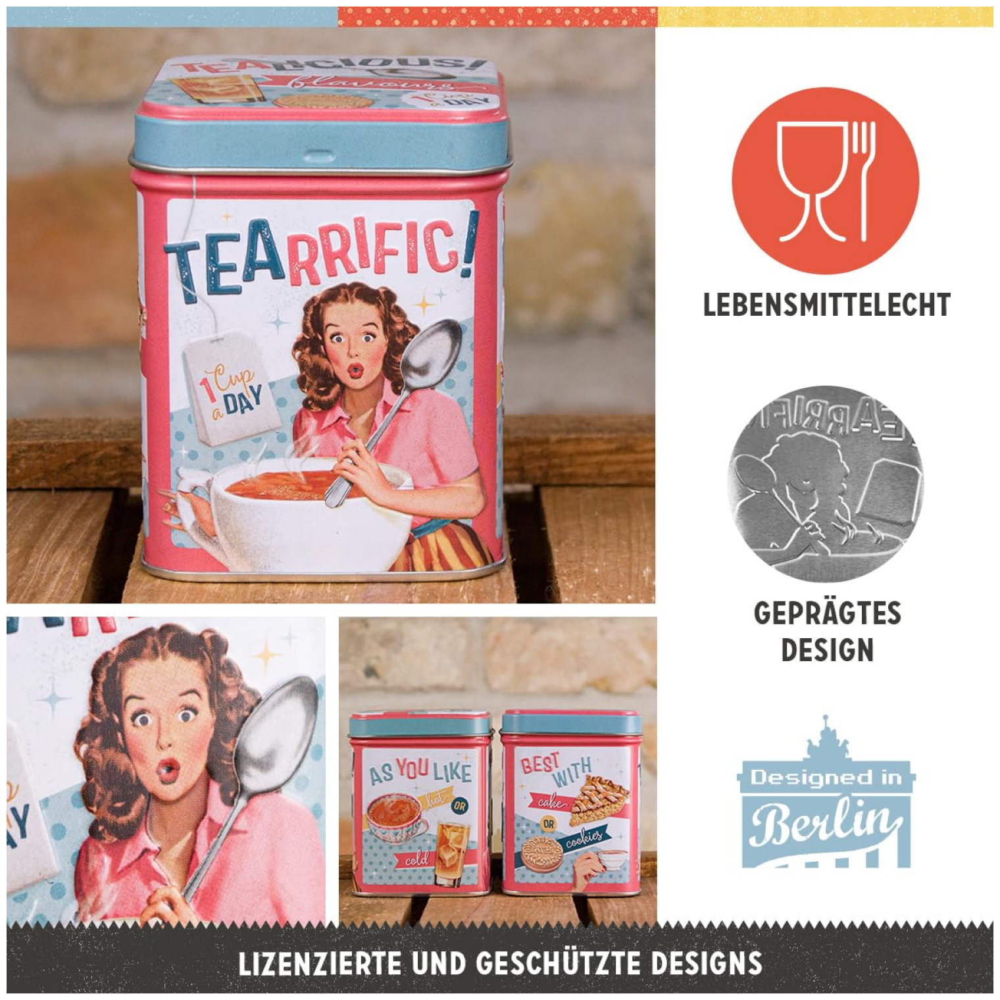

In [31]:
display(image_file)

In [32]:
image_file

'images\\71gSRbyXmoL.jpg'

### Inverted Images

In [36]:
inverted_image=cv2.bitwise_not(img)
cv2.imwrite("temp/inverted.jpg",inverted_image)


True

#### Rescaling

#### Binarization

In [37]:
# we must grayscale before binrization
def grayscale(image):
    return cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)


In [39]:
gray_image=grayscale(img)
cv2.imwrite('temp/grayscale.jpg',gray_image)

True

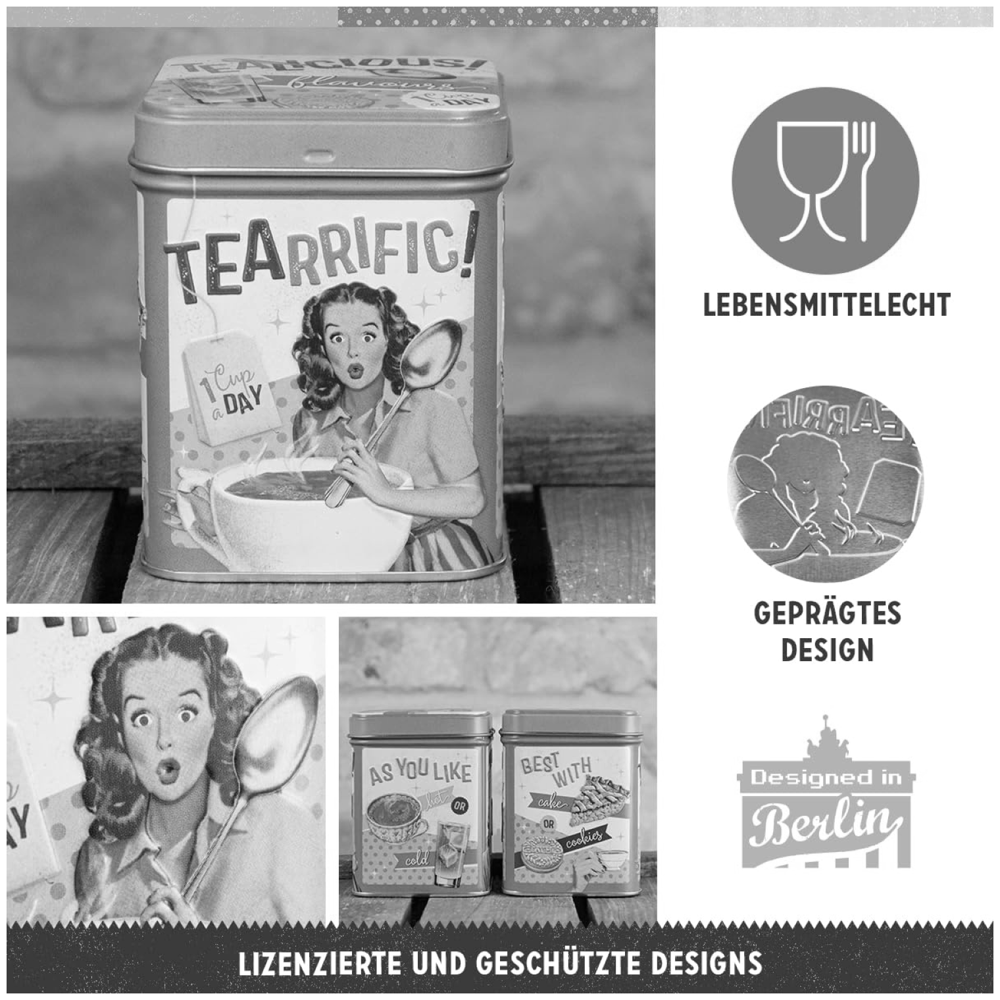

In [40]:
display("temp/grayscale.jpg")

In [48]:
_, otsu_thresh = cv2.threshold(gray_image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)


- > Given above is a grayscale version of my file


In [44]:
thresh,im_bw=cv2.threshold(gray_image,200,235,cv2.THRESH_BINARY)

In [50]:
cv2.imwrite("temp/bw_image.jpg",otsu_thresh)

True

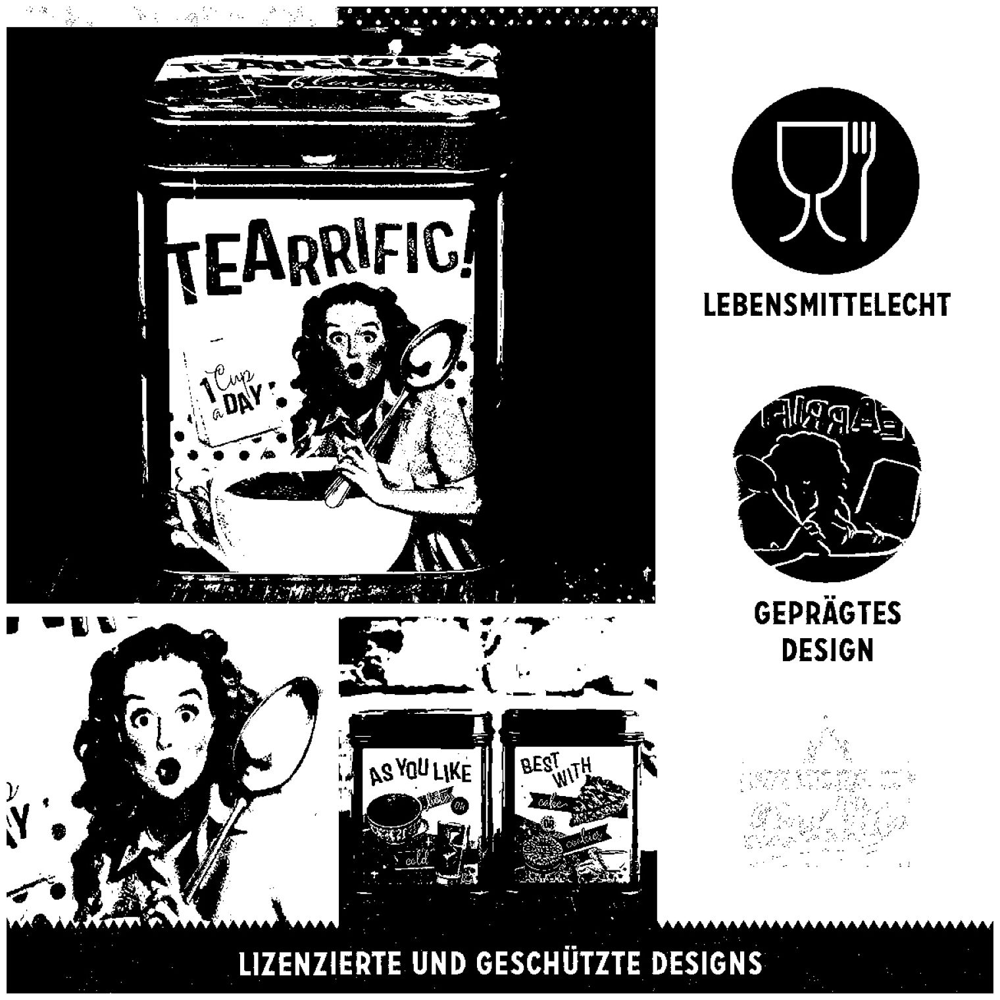

In [51]:
display("temp/bw_image.jpg")

#### Noise Removal

In [54]:
def noise_removal(image):
    import numpy as np
    kernel=np.ones((1,1),np.uint8)
    image=cv2.dilate(image,kernel,iterations=1)
    kernel=np.ones((1,1),np.uint8)
    image=cv2.erode(image,kernel,iterations=1)
    image=cv2.morphologyEx(image,cv2.MORPH_CLOSE,kernel)
    image=cv2.medianBlur(image,3)
    return image


In [55]:
no_noise=noise_removal(im_bw)
cv2.imwrite("temp/nonoise.jpg",no_noise)

True

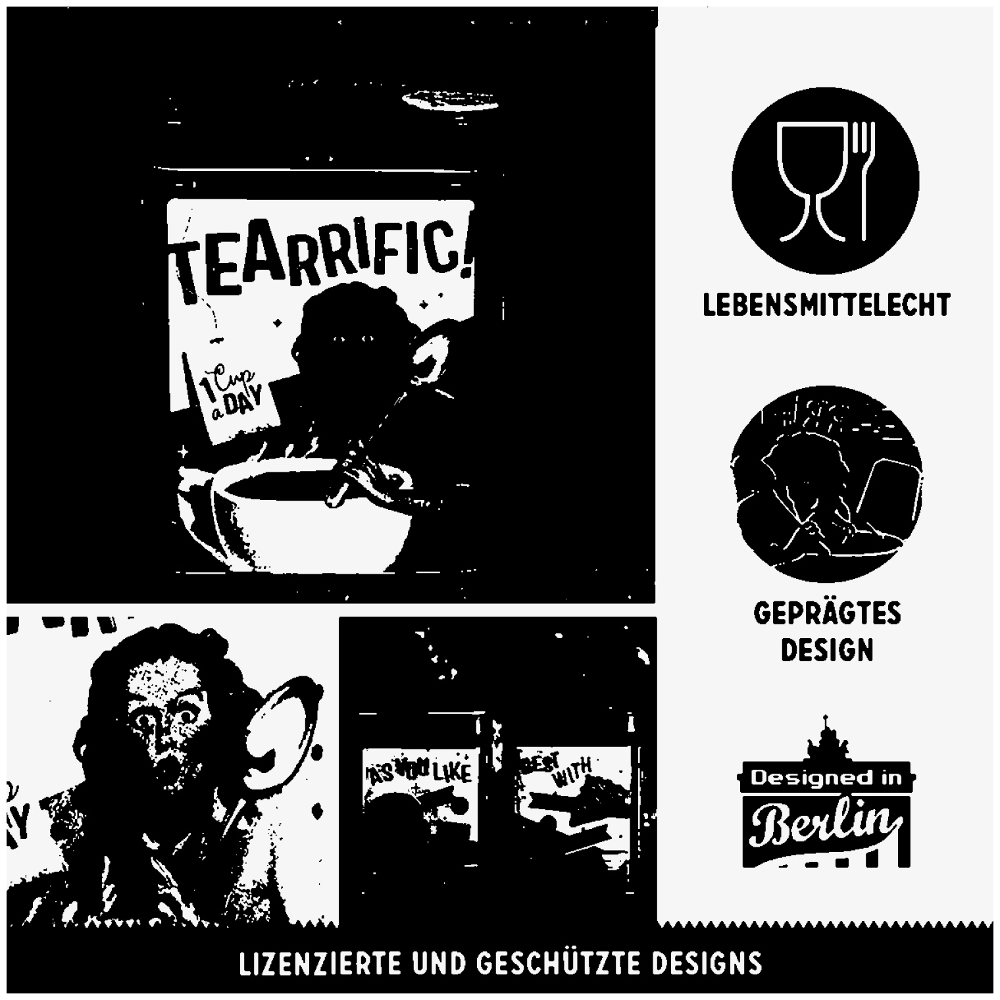

In [56]:
display("temp/nonoise.jpg")

In [57]:
thresh,im_bw=cv2.threshold(gray_image,200,235,cv2.THRESH_BINARY)
cv2.imwrite("temp/bw_image_2.jpg",im_bw)

True

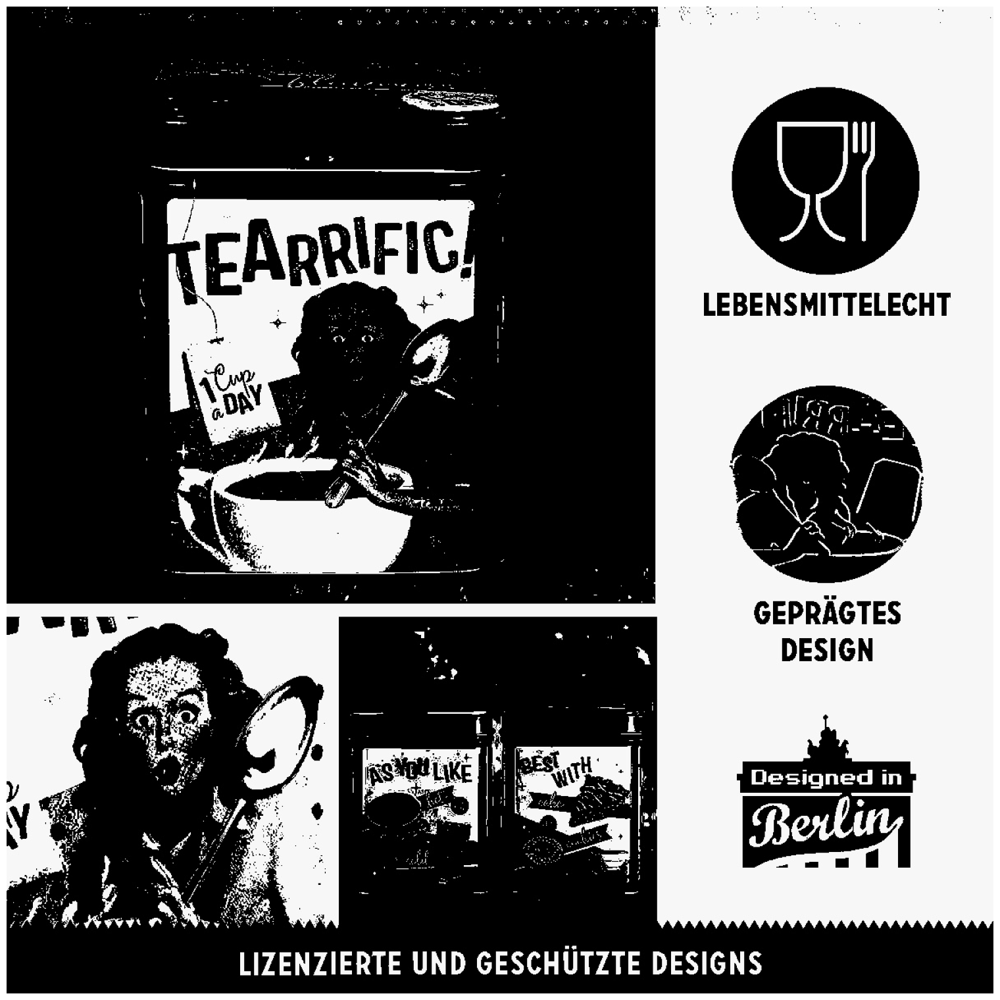

In [58]:
display("temp/bw_image_2.jpg")

In [59]:
no_noise_2=noise_removal(im_bw)
cv2.imwrite("temp/nonoise2.jpg",no_noise)

True

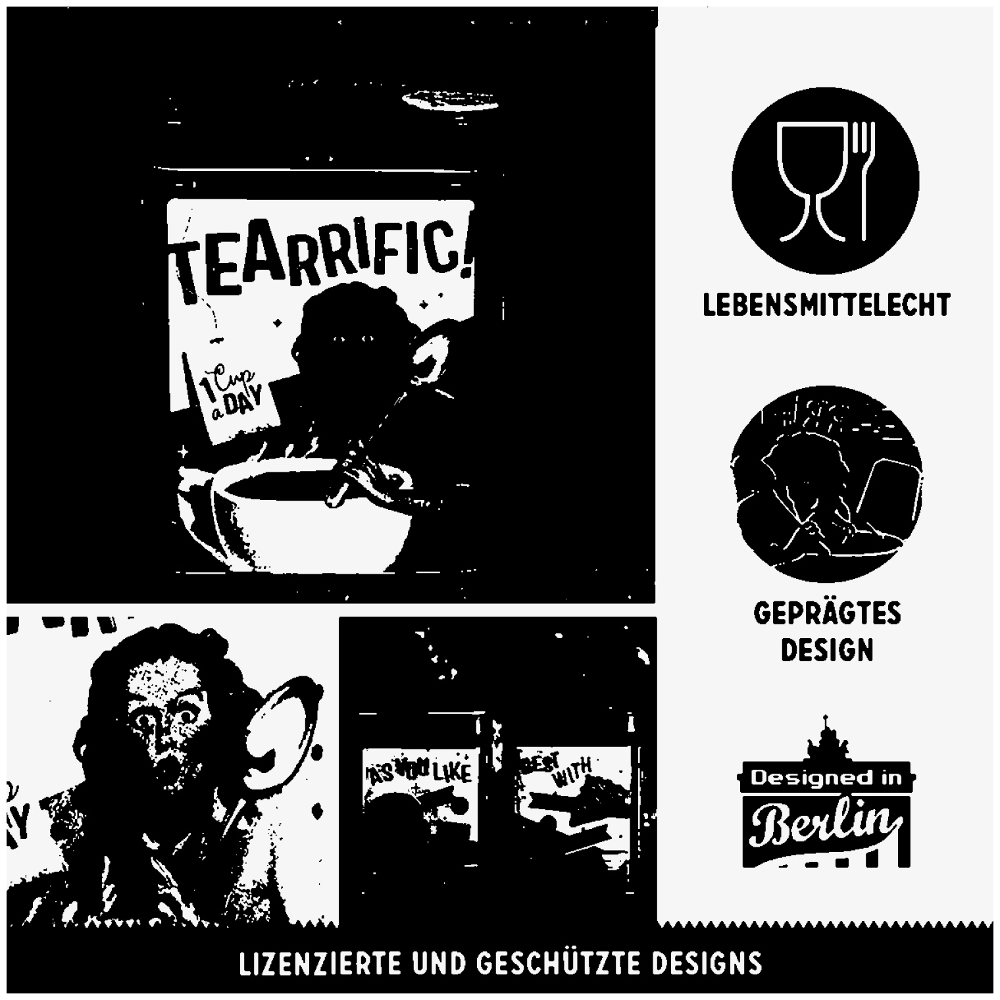

In [60]:
display("temp/nonoise2.jpg")

#### Dilation & Erosion

In [72]:
def thin_font(image):
    import numpy as np
    image=cv2.bitwise_not(image)
    kernel=np.ones((3,3),np.uint8)
    # iterations means same process kitni baar
    image=cv2.erode(image,kernel,iterations=1)
    # invert again to white bg
    image=cv2.bitwise_not(image)
    return image

In [73]:
eroded_image=thin_font(no_noise)
cv2.imwrite("temp/eroded_image.jpg",eroded_image)

True

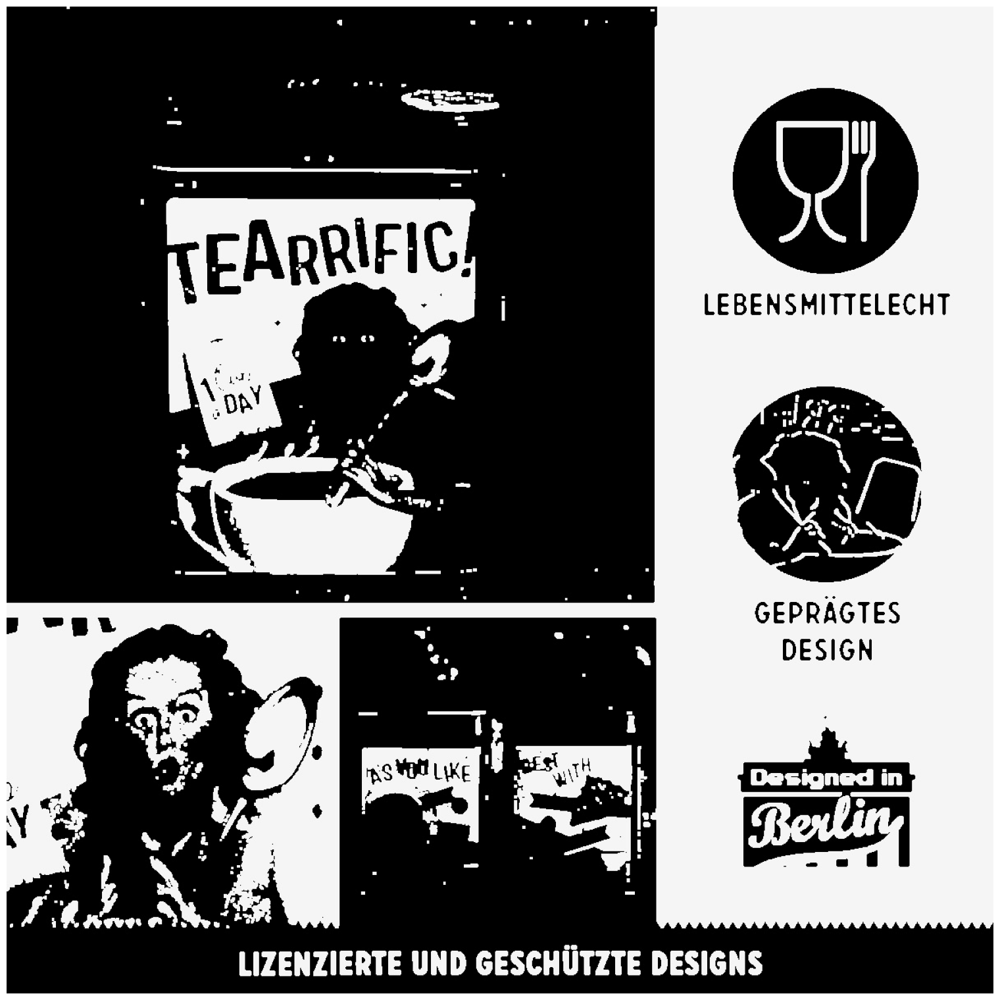

In [74]:
display("temp/eroded_image.jpg")

In [75]:
def thick_font(image):
    import numpy as np
    image=cv2.bitwise_not(image)
    kernel=np.ones((50,3),np.uint8)
    # iterations means same process kitni baar
    image=cv2.erode(image,kernel,iterations=1)
    # invert again to white bg
    image=cv2.bitwise_not(image)
    return image

In [76]:
dilated_image=thick_font(no_noise)

In [77]:
cv2.imwrite('temp/dilated_image.jpg',dilated_image)

True

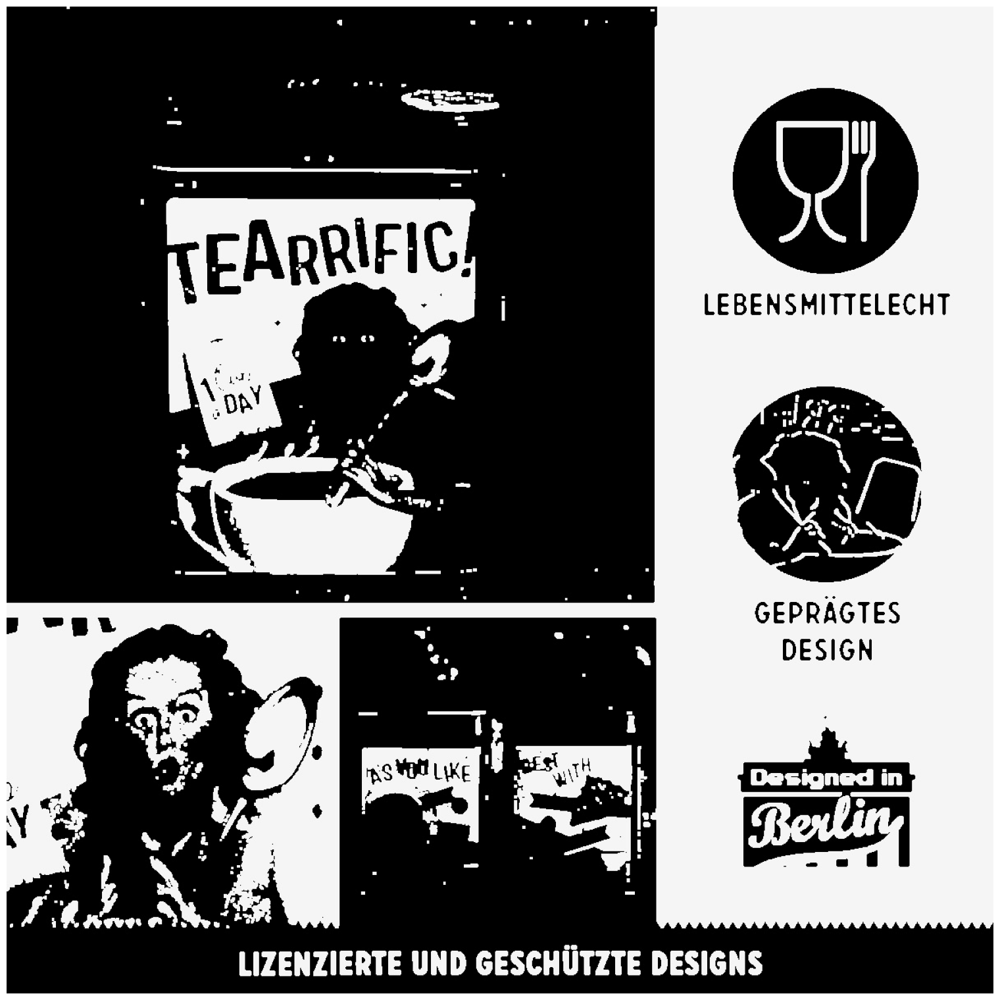

In [78]:
display("temp/dilated_image.jpg")

In [79]:
#https://becominghuman.ai/how-to-automatically-deskew-straighten-a-text-image-using-opencv-a0c30aed83df
import numpy as np

def getSkewAngle(cvImage) -> float:
    # Prep image, copy, convert to gray scale, blur, and threshold
    newImage = cvImage.copy()
    gray = cv2.cvtColor(newImage, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (9, 9), 0)
    thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

    # Apply dilate to merge text into meaningful lines/paragraphs.
    # Use larger kernel on X axis to merge characters into single line, cancelling out any spaces.
    # But use smaller kernel on Y axis to separate between different blocks of text
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (30, 5))
    dilate = cv2.dilate(thresh, kernel, iterations=2)

    # Find all contours
    contours, hierarchy = cv2.findContours(dilate, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
    contours = sorted(contours, key = cv2.contourArea, reverse = True)
    for c in contours:
        rect = cv2.boundingRect(c)
        x,y,w,h = rect
        cv2.rectangle(newImage,(x,y),(x+w,y+h),(0,255,0),2)

    # Find largest contour and surround in min area box
    largestContour = contours[0]
    print (len(contours))
    minAreaRect = cv2.minAreaRect(largestContour)
    cv2.imwrite("temp/boxes.jpg", newImage)
    # Determine the angle. Convert it to the value that was originally used to obtain skewed image
    angle = minAreaRect[-1]
    if angle < -45:
        angle = 90 + angle
    return -1.0 * angle
# Rotate the image around its center
def rotateImage(cvImage, angle: float):
    newImage = cvImage.copy()
    (h, w) = newImage.shape[:2]
    center = (w // 2, h // 2)
    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    newImage = cv2.warpAffine(newImage, M, (w, h), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)
    return newImage

In [93]:
# Deskew image
def deskew(cvImage):
    angle = getSkewAngle(cvImage)
    print("angle",angle)
    return rotateImage(cvImage, -1.0 * angle)

In [94]:
new=cv2.imread(r"images\612mrlqiI4L.jpg")

In [95]:
fixed=deskew(new)
cv2.imwrite("temp/rotated_fixed.jpg",fixed)

8
angle -90.0


True

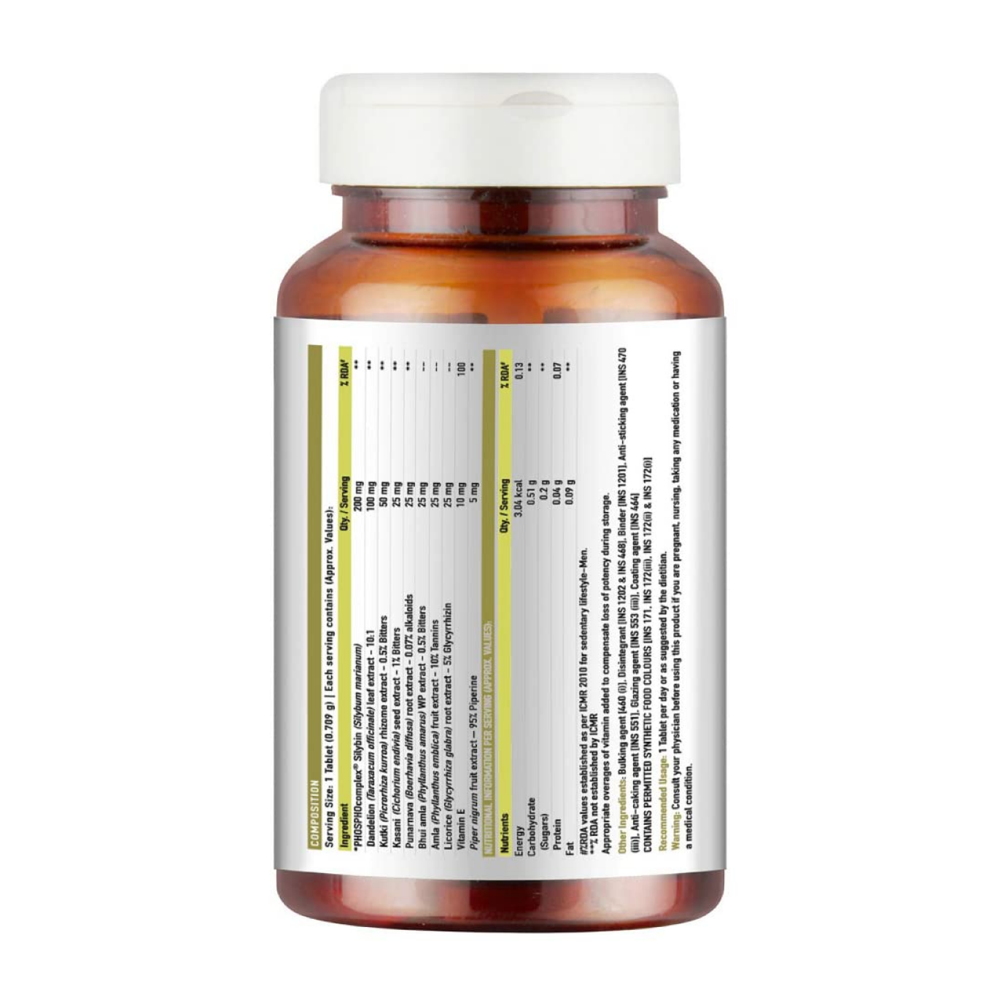

In [96]:
display(r"images\612mrlqiI4L.jpg")

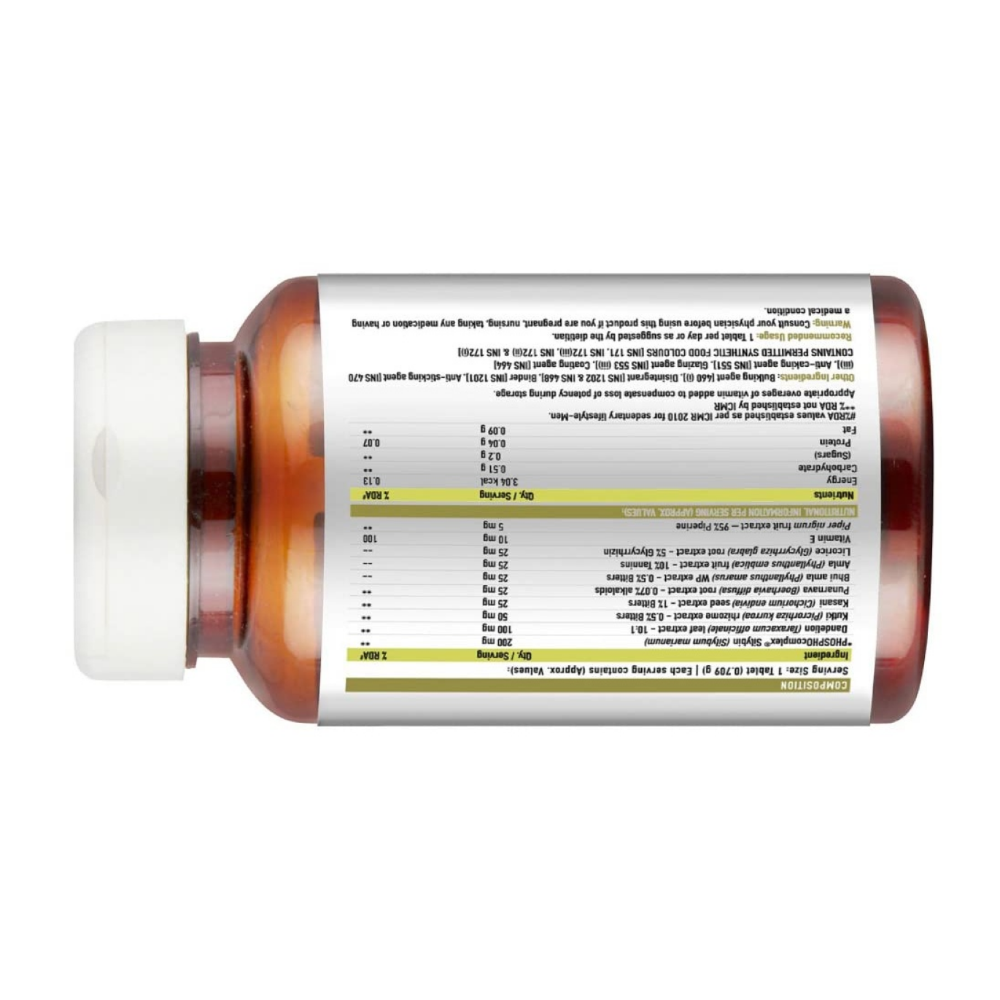

In [97]:
display("temp/rotated_fixed.jpg")

#### Removing Borders

In [98]:
import cv2

def remove_borders(image):
    # Find contours
    contours, hierarchy = cv2.findContours(image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    # Sort contours by area (largest first)
    cntSorted = sorted(contours, key=lambda x: cv2.contourArea(x))
    
    # Get the largest contour
    cnt = cntSorted[-1]
    
    # Get bounding rectangle around the largest contour
    x, y, w, h = cv2.boundingRect(cnt)
    
    # Crop the image to the bounding box
    crop = image[y:y+h, x:x+w]
    
    return crop


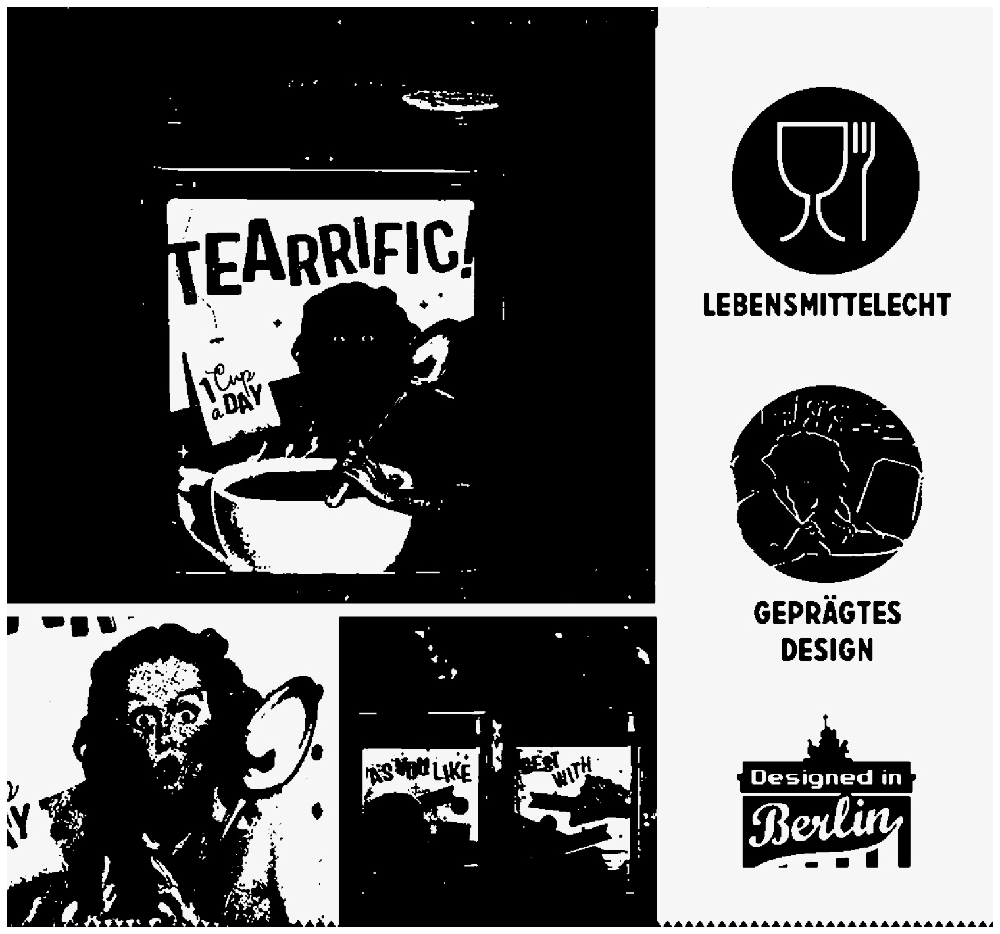

In [99]:
no_borders=remove_borders(no_noise)
cv2.imwrite("temp/noborder.jpg",no_borders)
display("temp/noborder.jpg")

#### Add a missing border


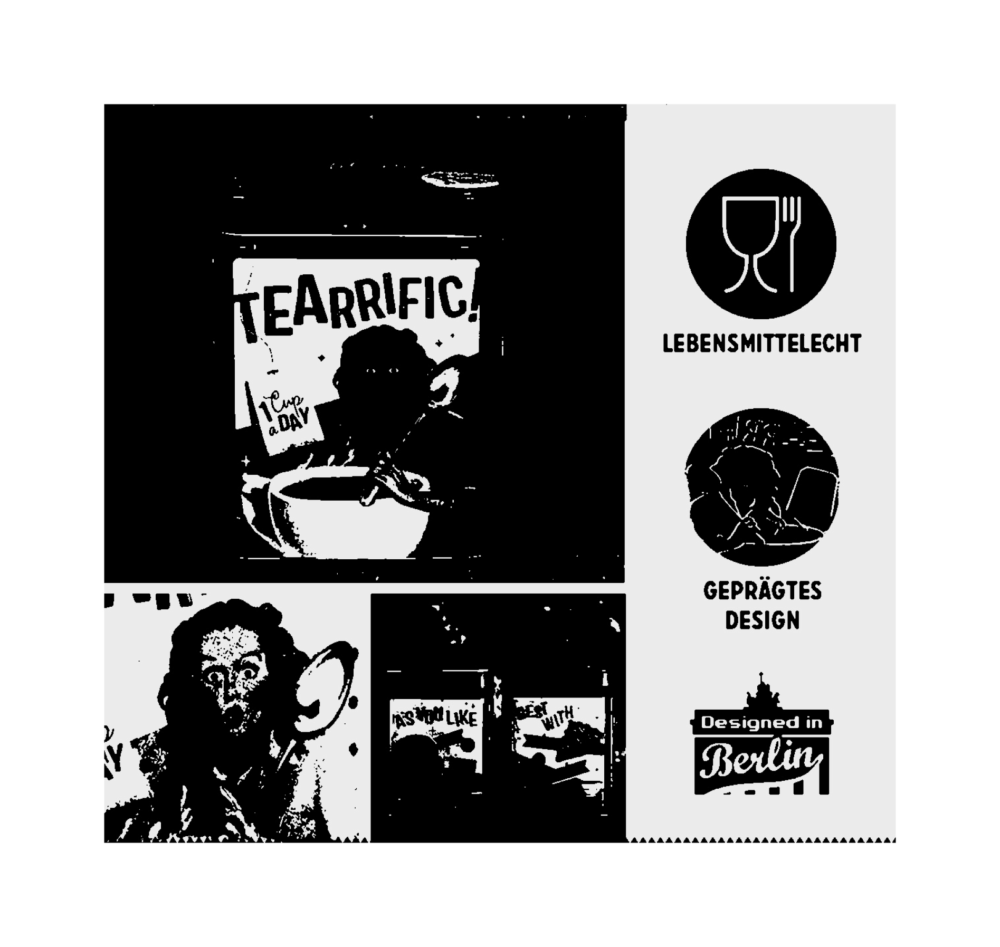

In [100]:
color=[255,255,255]
top,bottom,left,right=[150]*4
image_with_border=cv2.copyMakeBorder(no_borders,top,bottom,left,right,cv2.BORDER_CONSTANT,value=color)
cv2.imwrite("temp/imgwithborder.jpg",image_with_border)
display("temp/imgwithborder.jpg")




In [101]:
import matplotlib.pyplot as plt

In [102]:
img

array([[[205, 186, 151],
        [206, 187, 152],
        [208, 189, 154],
        ...,
        [104, 211, 245],
        [102, 209, 243],
        [101, 208, 242]],

       [[206, 187, 152],
        [207, 188, 153],
        [208, 189, 154],
        ...,
        [105, 212, 246],
        [103, 210, 244],
        [102, 209, 243]],

       [[207, 188, 153],
        [208, 189, 154],
        [209, 190, 155],
        ...,
        [106, 213, 247],
        [105, 212, 246],
        [104, 211, 245]],

       ...,

       [[ 55,  59,  60],
        [ 55,  59,  60],
        [ 55,  59,  60],
        ...,
        [ 55,  59,  60],
        [ 54,  58,  59],
        [ 54,  58,  59]],

       [[ 55,  59,  60],
        [ 55,  59,  60],
        [ 55,  59,  60],
        ...,
        [ 56,  60,  61],
        [ 54,  58,  59],
        [ 54,  58,  59]],

       [[ 55,  59,  60],
        [ 55,  59,  60],
        [ 55,  59,  60],
        ...,
        [ 56,  60,  61],
        [ 54,  58,  59],
        [ 54,  58,  59]]